In [1]:
import pandas as pd
import numpy as np
from func import make_boxplots_parametric,make_mcs_plot_grid_auto_vlim, make_ci_plot_grid_with_abbreviations,make_ci_plot_grid_with_abbreviations
from scipy.stats import levene
from statsmodels.stats.anova import AnovaRM
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm


Levene test for r2: p-value = 0.8407973747224474
Levene test for mae: p-value = 0.9971797865070954
Levene test for mse: p-value = 0.9296731265051215
Levene test for rho: p-value = 0.8879960338795738
r2     1.667021
mae    1.154727
mse    1.574181
rho    1.638042
dtype: float64
all less than 9?: True


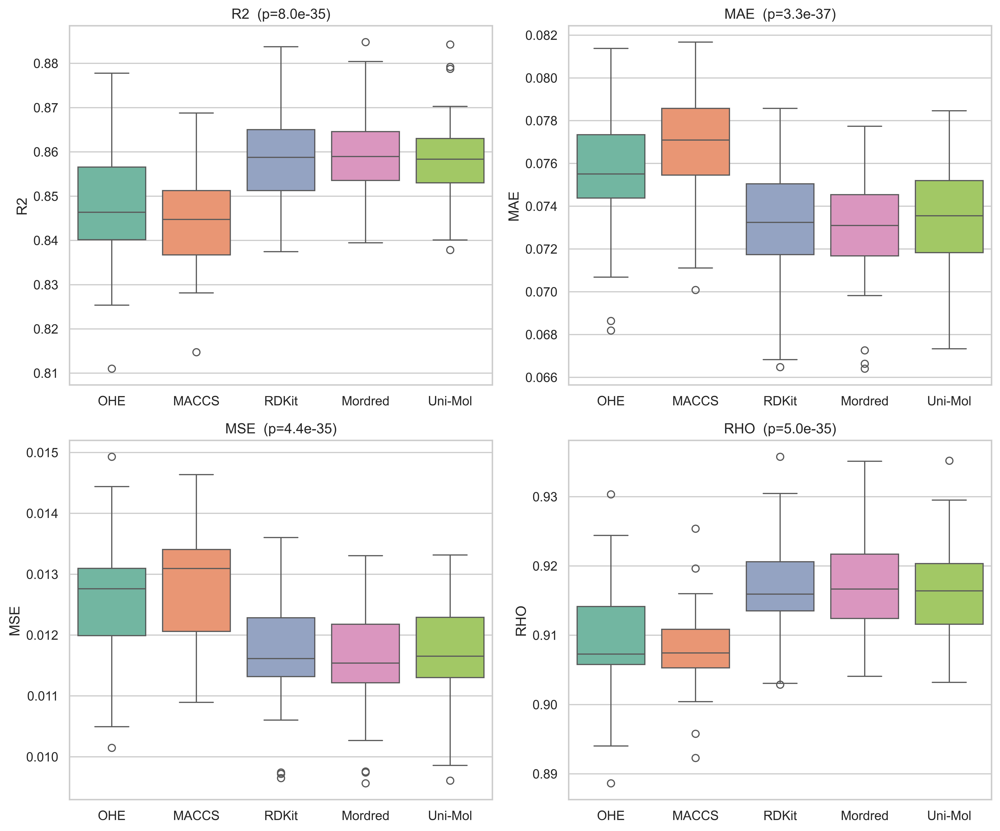

In [ ]:
# load data
file_path = "cv_results_sm.csv"
df_pep = pd.read_csv(file_path)

metrics = ["r2", "mae", "mse", "rho"]

results = {}

#Levene's test
for metric in metrics:
    groups = df_pep.groupby('method')[metric].apply(list)
    stat, pvalue = levene(*groups)
    print(f'Levene test for {metric}: p-value = {pvalue}')

variances_by_method = df_pep.groupby('method')[metrics].var()
max_fold_diff = variances_by_method.max() / variances_by_method.min()
print(max_fold_diff)
all_less_than_9 = (max_fold_diff < 9).all()

print(f"all less than 9?: {all_less_than_9}")
if not all_less_than_9:
    problematic_metrics = max_fold_diff[max_fold_diff >= 9].index.tolist()
    print(f"some metrics ≥ 9: {problematic_metrics}")
else:
    make_boxplots_parametric(df_pep,metrics)

    direction_dict = {
    'r2': 'maximize',
    'rho': 'maximize',      
    'mae': 'minimize',     
    'mse': 'minimize'      
}
    make_mcs_plot_grid_auto_vlim(
    df=df_pep,
    stats=metrics,
    group_col='method',
    cell_text_size=12,
    direction_dict=direction_dict,
    vlim_method='percentile' 
)
    make_ci_plot_grid_with_abbreviations(
    df_in=df_pep,
    metric_list=metrics,
    group_col='method',
    alpha=0.05,
    auto_xlim=True,
    xlim_factor=1.2,
    height_per_plot=3.5    
)
